In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory
import random
from skimage import io
from skimage import color
from PIL import Image
from IPython.display import display
import matplotlib.pyplot as plt
import seaborn as sns
from dask.array.image import imread
from dask import bag, threaded
from dask.diagnostics import ProgressBar
import cv2
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")



import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.utils import to_categorical
from keras.preprocessing import image 
from tensorflow.keras.layers import BatchNormalization
from keras import optimizers
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/state-farm-distracted-driver-detection/sample_submission.csv
/kaggle/input/state-farm-distracted-driver-detection/driver_imgs_list.csv
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_96590.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_32366.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_99675.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_85937.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_73903.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_89410.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_70462.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_45622.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_55507.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_34204.jpg
/kaggle/input/state-farm-distracted-driver-detection/imgs/test/img_16279.jpg
/kag

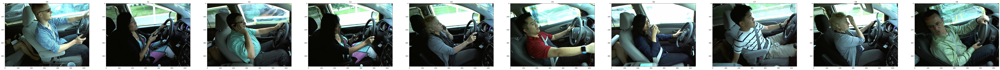

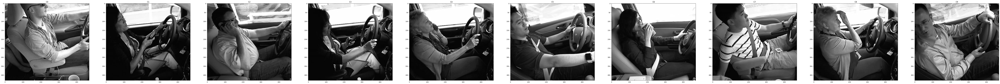

In [3]:
# getting one image per label
f, ax = plt.subplots(1,10, figsize = (120,120))
for i in range(10):
    labels = imread("/kaggle/input/state-farm-distracted-driver-detection/imgs/train/c"+str(i)+"/*.jpg")
    for j in range(1):
        img = labels[j]
        label = i
        ax[i].imshow(img)
        ax[i].set_title('C'+str(i))
        plt.show


# After Editing
f, ax = plt.subplots(1,10, figsize = (120,120))
for i in range(10):
    labels = imread("/kaggle/input/state-farm-distracted-driver-detection/imgs/train/c"+str(i)+"/*.jpg")
    for j in range(1):
        img = labels[j]
        img = color.rgb2gray(img)
        img = img[50:,120:-50]
        label = i
        ax[i].imshow(img,cmap='gray')
        ax[i].set_title('C'+str(i))
        plt.show

In [4]:
driver_details = pd.read_csv("/kaggle/input/state-farm-distracted-driver-detection/driver_imgs_list.csv",na_values='na')
print(driver_details.head(5))

  subject classname            img
0    p002        c0  img_44733.jpg
1    p002        c0  img_72999.jpg
2    p002        c0  img_25094.jpg
3    p002        c0  img_69092.jpg
4    p002        c0  img_92629.jpg


In [5]:
train_image = []
image_label = []


for i in range(10):
    print('now we are in the folder C',i)
    imgs = os.listdir("/kaggle/input/state-farm-distracted-driver-detection/imgs/train/c"+str(i))
    for j in range(len(imgs)):
    #for j in range(100):
        img_name = "/kaggle/input/state-farm-distracted-driver-detection/imgs/train/c"+str(i)+"/"+imgs[j]
        img = cv2.imread(img_name)
        img = color.rgb2gray(img)
        img = img[50:,120:-50]
        img = cv2.resize(img,(128,128))
        label = i
        driver = driver_details[driver_details['img'] == imgs[j]]['subject'].values[0]
        train_image.append([img,label,driver])
        image_label.append(i)

now we are in the folder C 0
now we are in the folder C 1
now we are in the folder C 2
now we are in the folder C 3
now we are in the folder C 4
now we are in the folder C 5
now we are in the folder C 6
now we are in the folder C 7
now we are in the folder C 8
now we are in the folder C 9


In [6]:
## Randomly shuffling the images

import random
random.shuffle(train_image)

In [7]:
## getting list of driver names

D = []
for features,labels,drivers in train_image:
    D.append(drivers)

## Deduplicating drivers

deduped = []

for i in D:
    if i not in deduped:
        deduped.append(i)
    

## selecting random drivers for the validation set
driv_selected = []
import random
driv_nums = random.sample(range(len(deduped)), 4)
for i in driv_nums:
    driv_selected.append(deduped[i])

In [8]:
## Splitting the train and test

X_train= []
y_train = []
X_test = []
y_test = []
D_train = []
D_test = []

for features,labels,drivers in train_image:
    if drivers in driv_selected:
        X_test.append(features)
        y_test.append(labels)
        D_test.append(drivers)
    
    else:
        X_train.append(features)
        y_train.append(labels)
        D_train.append(drivers)
    
print (len(X_train),len(X_test))
print (len(y_train),len(y_test))

18598 3826
18598 3826


In [9]:
## Converting images to nparray. Encoding the Y

X_train = np.array(X_train).reshape(-1,128,128,1)
X_test = np.array(X_test).reshape(-1,128,128,1)
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)


print (X_train.shape)

(18598, 128, 128, 1)


In [10]:
## Designing the Layers
model = Sequential()

model.add(Conv2D(32, kernel_size=(3, 3),activation='relu',input_shape=(128,128,1),padding = 'same'))
model.add(BatchNormalization())

model.add(Conv2D(32, kernel_size=(3, 3),activation='relu',input_shape=(128,128,1),padding = 'same'))
model.add(BatchNormalization())

model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64,kernel_size = (3,3),activation = 'relu',padding = 'same'))
model.add(BatchNormalization())

model.add(Conv2D(64,kernel_size = (3,3),activation = 'relu',padding = 'same'))
model.add(BatchNormalization())

model.add(Dropout(0.3))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64,kernel_size = (3,3),activation = 'relu',padding = 'same'))
model.add(BatchNormalization())


model.add(Conv2D(64,kernel_size = (3,3),activation = 'relu',padding = 'same'))
model.add(BatchNormalization())


model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(128,kernel_size = (3,3),activation = 'relu',padding = 'same'))
model.add(BatchNormalization())

model.add(Flatten())

model.add(Dense(128, activation = 'relu'))


model.add(Dense(10, activation='softmax'))

sgd = optimizers.SGD(learning_rate= 0.001)
model.compile(loss='categorical_crossentropy',optimizer = sgd,metrics=['accuracy'])

In [11]:
## Fitting the model

model.fit(X_train, y_train, epochs=5, validation_data=(X_test, y_test))

Epoch 1/5


I0000 00:00:1728825541.954448     117 service.cc:145] XLA service 0x7a12a8010e90 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1728825541.954509     117 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  6/582 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - accuracy: 0.1714 - loss: 2.8058

I0000 00:00:1728825548.222608     117 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


582/582 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - accuracy: 0.5605 - loss: 1.3747 - val_accuracy: 0.2825 - val_loss: 2.1521
Epoch 2/5
582/582 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.9754 - loss: 0.1277 - val_accuracy: 0.4124 - val_loss: 1.8951
Epoch 3/5
582/582 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - accuracy: 0.9901 - loss: 0.0647 - val_accuracy: 0.4310 - val_loss: 1.7914
Epoch 4/5
582/582 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.9947 - loss: 0.0387 - val_accuracy: 0.4028 - val_loss: 2.0113
Epoch 5/5
582/582 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.9968 - loss: 0.0263 - val_accuracy: 0.4438 - val_loss: 1.8242


In [12]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


# Define data augmentation parameters
datagen = ImageDataGenerator(
    height_shift_range=0.1,  # Adjusted to be a percentage of the total height
    width_shift_range=0.1,   # Adjusted to be a percentage of the total width
    zoom_range=0.1,          # Adjusted to be a percentage of the total image size
    rotation_range=30
)

# Fit the data generator on training data (optional for some settings)
datagen.fit(X_train)

# Create a data generator for training
data_generator = datagen.flow(X_train, y_train, batch_size=64)

# Train the model using the data generator
aug_model = model.fit(
    data_generator,
    steps_per_epoch=len(X_train) // 64,  # Use integer division
    epochs=15,
    verbose=1,
    validation_data=(X_test, y_test)
)

Epoch 1/15
290/290 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step - accuracy: 0.3883 - loss: 2.0170 - val_accuracy: 0.5382 - val_loss: 1.5512
Epoch 2/15
290/290 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.5312 - loss: 1.4291 - val_accuracy: 0.5264 - val_loss: 1.5787
Epoch 3/15
290/290 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - accuracy: 0.5588 - loss: 1.2931 - val_accuracy: 0.4587 - val_loss: 1.9766
Epoch 4/15
290/290 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7188 - loss: 0.8757 - val_accuracy: 0.5267 - val_loss: 1.6627
Epoch 5/15
290/290 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - accuracy: 0.6687 - loss: 0.9659 - val_accuracy: 0.5695 - val_loss: 1.6531
Epoch 6/15
290/290 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7969 - loss: 0.8604 - val_accuracy: 0.5768 - val_loss: 1.6402
Epoch 7/15
290/290 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - accuracy: 0.7402 - loss: 0.7923 - val_accuracy: 0.6438 - val_loss: 1.3601
Epoch 8/15
290/290 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7344 - loss: 0.9368 - val_acc

In [13]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 32, 32, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     4,194,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴─────────────

 Total params: 4,410,220 (16.82 MB)

 Trainable params: 4,409,322 (16.82 MB)

 Non-trainable params: 896 (3.50 KB)

 Optimizer params: 2 (12.00 B)